# Install packages needed

Some notes about using geospatial libaries on Windows. I had several issues trying to instal trhough pip install the packages gdal, fiona and geopy. All the errors were related to not finding proper GDAL package.

Note about GDAL and fiona Installation troubles when using Windows:
https://stackoverflow.com/questions/34408699/having-trouble-installing-gdal-for-python
https://stackoverflow.com/questions/60071060/issues-with-installing-gdal-for-python-3-7-3
    
To solve that issues and get GDAL isntalled on Windows, you need to follow the below-mentioned step: -
You need to install GDAL wheel file using the link https://www.lfd.uci.edu/~gohlke/pythonlibs/#gdal . After visiting this link, download this file named "GDAL‑3.0.4‑cp37‑cp37m‑win32.whl" since it worked for me and then use the command "pip install c:\Users........\GDAL‑3.0.4‑cp37‑cp37m‑win32.whl" to successfully install GDAL which is the requirement of Geopandas.
NOTE: If the above-mentioned wheel file doesn't work for you, then try using alternate wheel files.

In [66]:
#!pip install pipwin
#pip install gdal
#!pip install fionab
# !pip install geopandas
#!pip install geopy
# !pip install C:\Users\handr\Downloads\GDAL-3.2.1-cp37-cp37m-win_amd64.whl
# !pip install C:\Users\handr\Downloads\Fiona-1.8.18-cp37-cp37m-win_amd64.whl    

# Import all the libraries needed in the code

In [13]:
from selenium import webdriver
import pandas as pd
import time
from datetime import date
from selenium.webdriver.common.by import By
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.common.action_chains import ActionChains
import re 
import seaborn as sns
import numpy as np
import math
from geopy.extra.rate_limiter import RateLimiter
import geopy
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter

## Set pandas configuration needed

In [70]:
#suppress cientific notation when plotting dataframes
pd.set_option('display.float_format', str)
pd.option_context('display.float_format', '{:0.2}'.format)
#wrap lines to see full urls in a single view
pd.set_option('display.max_colwidth', None)
%matplotlib inline

## Load the initial page in Chrome

With the absence of quality datasets about housing prices in Curitiba-PR- Brazil (my local city), I decided to scrap a brazilian site called *Viva Real* to gather some information about location and prices of residential apartments. The main intent of this project was to practice Selenium to get data and performing some descriptive analysis on the data.

*The data was collect on 20210216 and it's not intended to be exhaustive.

In [3]:
options = webdriver.ChromeOptions()
options.add_argument('headless')
options.add_argument('window-size=1920x1080')
options.add_argument('--incognito')
driver = webdriver.Chrome("C:/Users/handr/Downloads/chromedriver_win32/chromedriver.exe")
driver.get("https://www.vivareal.com.br/venda/parana/curitiba/apartamento_residencial")

In [4]:
total_records = driver.find_element_by_xpath('/html/body/main/div[2]/div[1]/section/header/div/div/div[1]/div/h1/strong')
print("Total apartments listed in Curitiba: " + total_records.text)

Total apartments listed in Curitiba: 43.289


In [5]:
df = pd.DataFrame(columns = ['address', 'size', 'price', 'garage','bedroom','bathroom', 'url'])

In [ ]:
address_list = []
size_list = []
price_list = []
garage_list = []
bathroom_list = []
bedroom_list = []
url_list = []
  
def get_info():
    try:
        ads = driver.find_elements_by_class_name("js-property-card")
        for ad in ads:
            address = ad.find_element_by_class_name("property-card__address").text
            size = ad.find_element_by_class_name('js-property-card-detail-area').text
            price = ad.find_element_by_class_name('js-property-card__price-small').text
            garage = ad.find_element_by_class_name('js-property-detail-garages').text
            bathroom = ad.find_element_by_class_name('js-property-detail-bathroom').text
            bedroom = ad.find_element_by_class_name('js-property-detail-rooms').text
            url = ad.find_element_by_class_name('js-listing-labels-link').get_attribute('href')
            if address == '':
                break
            address_list.append(address)
            size_list.append(size)
            price_list.append(price)
            garage_list.append(garage)
            bathroom_list.append(bathroom)
            bedroom_list.append(bedroom)
            url_list.append(url)
    except Exception:     
        print('Error found while gathering data from URL: '+ driver.current_url)

print('Acquiring data, please wait.')
for i in range(1500):
        get_info()
        element = driver.find_element_by_class_name("js-change-page")
        actions = ActionChains(driver)
        actions.move_to_element(element).perform()
        element2 = WebDriverWait(driver, 30).until(
            EC.element_to_be_clickable((By.XPATH, '//*[@id="js-site-main"]/div[2]/div[1]/section/div[2]/div[2]/div/ul/li[9]/a')))
        #todo: if not clickable, throw an exception
        try: 
            driver.find_element_by_xpath('//*[@id="js-site-main"]/div[2]/div[1]/section/div[2]/div[2]/div/ul/li[9]/a').click()
        except Exception:
            print('Não localizado o elemento de próxima página, encerrando a execução.')
            break
        time.sleep(5)

In [7]:
df['address'] = address_list
df['size'] = size_list
df['price'] = price_list
df['garage'] = garage_list
df['bathroom'] = bathroom_list
df['bedroom'] = bedroom_list
df['url'] = url_list

In [8]:
df

,address,size,price,garage,bedroom,bathroom,url
0,"Rua Coronel Ottoni Maciel, 228 - Vila Izabel, Curitiba - PR",106,R$ 725.000,1 Vaga,3 Quartos,3 Banheiros,https://www.vivareal.com.br/imovel/apartamento-3-quartos-vila-izabel-bairros-curitiba-com-garagem-106m2-venda-RS725000-id-2501621509/
1,"Avenida Marechal Floriano Peixoto, 696 - Centro, Curitiba - PR",33,R$ 240.000,-- Vaga,1 Quarto,1 Banheiro,https://www.vivareal.com.br/imoveis-lancamento/central-station-2473213876/
2,"Avenida João Gualberto, 1313 - Juvevê, Curitiba - PR",77,R$ 380.000,1 Vaga,2 Quartos,1 Banheiro,https://www.vivareal.com.br/imovel/apartamento-2-quartos-juveve-bairros-curitiba-com-garagem-77m2-venda-RS380000-id-2468009070/
3,"Rua Francisco Raitani, 7081 - Capão Raso, Curitiba - PR",70,R$ 260.000,1 Vaga,3 Quartos,2 Banheiros,https://www.vivareal.com.br/imovel/apartamento-3-quartos-capao-raso-bairros-curitiba-com-garagem-70m2-venda-RS260000-id-2506743276/
4,"Rua Morretes, 1174 - Portão, Curitiba - PR",73,R$ 500.000,2 Vagas,3 Quartos,2 Banheiros,https://www.vivareal.com.br/imovel/apartamento-3-quartos-portao-bairros-curitiba-com-garagem-73m2-venda-RS500000-id-2472408476/
...,...,...,...,...,...,...,...
10519,"Rua Pedro Locatelli Júnior, 94 - Guabirotuba, Curitiba - PR",62,R$ 189.900,1 Vaga,3 Quartos,1 Banheiro,https://www.vivareal.com.br/imovel/apartamento-3-quartos-guabirotuba-bairros-curitiba-com-garagem-62m2-venda-RS189900-id-2505653760/
10520,"Batel, Curitiba - PR",113,R$ 1.555.262,3 Vagas,2 Quartos,2 Banheiros,https://www.vivareal.com.br/imovel/apartamento-2-quartos-batel-bairros-curitiba-com-garagem-113m2-venda-RS1555262-id-2508429825/
10521,"Campo Comprido, Curitiba - PR",43,R$ 150.000,1 Vaga,3 Quartos,1 Banheiro,https://www.vivareal.com.br/imovel/apartamento-3-quartos-campo-comprido-bairros-curitiba-com-garagem-43m2-venda-RS150000-id-2486520782/
10522,"Rua Engenheiro Arthur Bettes, 49 - Portão, Curitiba - PR",102-108,R$ 708.000,2 Vagas,3 Quartos,2 Banheiros,https://www.vivareal.com.br/imoveis-lancamento/evora-8279/


In [10]:
#Export data to a local file
today = date.today()
df.to_csv(r'C:\Users\handr\Python\dados_viva_real_'+today.strftime('%Y%m%d')+'.csv', index=False, encoding='utf-8')
print('File generated successfuly.')

File generated successfuly.


In [11]:
driver.close()

So that, we have now a dataframe containing some information as listed below:
* Address of the apartment (full address);
* Size;
* Price (BRL);
* Total of garage vacancies;
* Total of bedrooms and bathrooms;
* URL of the ad.


# Data cleaning and analysis



In [95]:
df = pd.read_csv(r'C:\Users\handr\Python\dados_viva_real_20210216.csv')
df.sort_values(by='price')

,address,size,price,garage,bedroom,bathroom,url
89,"Rua Manoel Eufrásio, 949 - Juvevê, Curitiba - PR",119-195,A partir de\nR$ 1.023.000,2-4 Vagas,3 Quartos,2-4 Banheiros,https://www.vivareal.com.br/imoveis-lancamento/terrasse-riviere-2434809514/
203,"Rua Doutor Alexandre Gutierrez, 49 - Água Verde, Curitiba - PR",153-299,A partir de\nR$ 1.755.000,3 Vagas,3 Quartos,3 Banheiros,https://www.vivareal.com.br/imoveis-lancamento/lalique-residence-2493238485/
120,"Rua Alferes Ângelo Sampaio, 2566 - Bigorrilho, Curitiba - PR",178-310,A partir de\nR$ 1.780.000,3-4 Vagas,3-4 Quartos,5-6 Banheiros,https://www.vivareal.com.br/imoveis-lancamento/rubem-franca-2489795795/
614,"Rua Ladislau Gubaua, 456 - Lamenha Grande, Almirante Tamandaré - PR",41-45,A partir de\nR$ 128.000,1 Vaga,2 Quartos,1 Banheiro,https://www.vivareal.com.br/imoveis-lancamento/uno-ipanema-2484798494/
628,"Rua Elizio Ferreira do Nascimento, 961 - Tanguá, Almirante Tamandaré - PR",41,A partir de\nR$ 131.400,1 Vaga,2 Quartos,1 Banheiro,https://www.vivareal.com.br/imoveis-lancamento/porto-tingui-2502165587/
...,...,...,...,...,...,...,...
265,"Rua Martim Afonso, 2800 - Bigorrilho, Curitiba - PR",121-394,Sob Consulta,3-4 Vagas,2-4 Quartos,2-4 Banheiros,https://www.vivareal.com.br/imoveis-lancamento/casa-milano-2508528312/
569,"Rua Deputado Heitor Alencar Furtado, 3273 - Campo Comprido, Curitiba - PR",341,Sob Consulta,4 Vagas,3-4 Quartos,4-5 Banheiros,https://www.vivareal.com.br/imoveis-lancamento/seventy-upper-mansion-2493773323/
597,"Rua Monsenhor Ivo Zanlorenzi, 4400 - Cidade Industrial, Curitiba - PR",113,Sob Consulta,2 Vagas,2-3 Quartos,1 Banheiro,https://www.vivareal.com.br/imoveis-lancamento/parque-ecoville-torre-barigui-2504454048/
856,"Avenida Nereu Ramos, 4062 - Meia Praia, Itapema - SC",133,Sob Consulta,2-3 Vagas,3 Quartos,3 Banheiros,https://www.vivareal.com.br/imoveis-lancamento/villa-lobos-2505644593/


From the initial data, I started building some new variables and some processing on the existing columns. After this processing the dataframe will contain: 
* Minimum and maximum number of bedrooms, bathrooms and size (in square meters);
* Street name;
* Neighborhood name;
* Address number.

PS: The maximum and minimum variables were built for some cases where the same listed apartament have multiple possible values (according to the size).

In [96]:
df_prep = df
df_prep['address'] = df_prep['address'].str.replace('BR-116', 'BR 116')
df_prep['bathroom'] = df_prep['bathroom'].str.rstrip(' Banheiros')
df_prep['bedroom'] = df_prep['bedroom'].str.rstrip(' Quartos').str.rstrip(' Quarto')
df_prep['garage'] = df_prep['garage'].str.rstrip(' Vaga').str.rstrip(' Vagas')
df_prep['street_name'] = df_prep['address'].str.split(',', 1, expand=True)[0]
df_prep['number'] = df_prep['address'].str.extract(pat = '([\d]+.)') 
df_prep['city'] = df_prep['address'].str.rsplit(',', 1, expand=True)[1].str.split('-',1, expand=True)[0]
df_prep['neighborhood'] = df_prep['address'].str.rsplit(',', 1, expand=True)[0].str.rsplit('-',1,expand = True)[1].str.strip()
df_prep['price_adj'] = df_prep['price'].str.strip('A partir de\n').str.strip('R$').str.replace('Sob Consulta','').str.replace('Sob Consul','').str.replace('.','')
df_prep[['min_size','max_size']] = df_prep['size'].str.split('-', 1, expand=True)
df_prep[['min_garage','max_garage']] = df_prep['garage'].str.split('-', 1, expand=True)
df_prep['street_name'] = df_prep['street_name'].str.replace(',','').str.replace('-','')
df_prep

,address,size,price,garage,bedroom,bathroom,url,street_name,number,city,neighborhood,price_adj,min_size,max_size,min_garage,max_garage
0,"Rua Coronel Ottoni Maciel, 228 - Vila Izabel, Curitiba - PR",106,R$ 725.000,1,3,3,https://www.vivareal.com.br/imovel/apartamento-3-quartos-vila-izabel-bairros-curitiba-com-garagem-106m2-venda-RS725000-id-2501621509/,Rua Coronel Ottoni Maciel,228,Curitiba,Vila Izabel,725000,106,None,1,None
1,"Avenida Marechal Floriano Peixoto, 696 - Centro, Curitiba - PR",33,R$ 240.000,--,1,1,https://www.vivareal.com.br/imoveis-lancamento/central-station-2473213876/,Avenida Marechal Floriano Peixoto,696,Curitiba,Centro,240000,33,None,,-
2,"Avenida João Gualberto, 1313 - Juvevê, Curitiba - PR",77,R$ 380.000,1,2,1,https://www.vivareal.com.br/imovel/apartamento-2-quartos-juveve-bairros-curitiba-com-garagem-77m2-venda-RS380000-id-2468009070/,Avenida João Gualberto,1313,Curitiba,Juvevê,380000,77,None,1,None
3,"Rua Francisco Raitani, 7081 - Capão Raso, Curitiba - PR",70,R$ 260.000,1,3,2,https://www.vivareal.com.br/imovel/apartamento-3-quartos-capao-raso-bairros-curitiba-com-garagem-70m2-venda-RS260000-id-2506743276/,Rua Francisco Raitani,7081,Curitiba,Capão Raso,260000,70,None,1,None
4,"Rua Morretes, 1174 - Portão, Curitiba - PR",73,R$ 500.000,2,3,2,https://www.vivareal.com.br/imovel/apartamento-3-quartos-portao-bairros-curitiba-com-garagem-73m2-venda-RS500000-id-2472408476/,Rua Morretes,1174,Curitiba,Portão,500000,73,None,2,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10519,"Rua Pedro Locatelli Júnior, 94 - Guabirotuba, Curitiba - PR",62,R$ 189.900,1,3,1,https://www.vivareal.com.br/imovel/apartamento-3-quartos-guabirotuba-bairros-curitiba-com-garagem-62m2-venda-RS189900-id-2505653760/,Rua Pedro Locatelli Júnior,94,Curitiba,Guabirotuba,189900,62,None,1,None
10520,"Batel, Curitiba - PR",113,R$ 1.555.262,3,2,2,https://www.vivareal.com.br/imovel/apartamento-2-quartos-batel-bairros-curitiba-com-garagem-113m2-venda-RS1555262-id-2508429825/,Batel,NaN,Curitiba,None,1555262,113,None,3,None
10521,"Campo Comprido, Curitiba - PR",43,R$ 150.000,1,3,1,https://www.vivareal.com.br/imovel/apartamento-3-quartos-campo-comprido-bairros-curitiba-com-garagem-43m2-venda-RS150000-id-2486520782/,Campo Comprido,NaN,Curitiba,None,150000,43,None,1,None
10522,"Rua Engenheiro Arthur Bettes, 49 - Portão, Curitiba - PR",102-108,R$ 708.000,2,3,2,https://www.vivareal.com.br/imoveis-lancamento/evora-8279/,Rua Engenheiro Arthur Bettes,49,Curitiba,Portão,708000,102,108,2,None


In [97]:
df_city_filter = df_prep[df_prep['city'].str.contains('Curitiba', na=False)]
df_city_filter = df_city_filter[ (df_city_filter.price_adj != '') & (df_city_filter.min_size != '')]
df_city_filter['price_adj'] = df_city_filter['price_adj'].astype("float")
df_city_filter['min_size'] = df_city_filter['min_size'].astype("float")
df_city_filter['max_size'] = df_city_filter['max_size'].astype("float")
df_city_filter['ratio_price_sq_mtrs'] = df_city_filter['price_adj'] / df_city_filter['min_size']
df_city_filter.loc[df_city_filter['neighborhood'].isnull() , 'neighborhood'] = df_city_filter.address.str.split(',',1,expand=True)[0]

In [98]:
print('Total of distinct neighborhoods: ', df_city_filter.neighborhood.nunique())

Total of distinct neighborhoods:  78


In [99]:
print('Total ads evaluated: ',df_city_filter.shape[0])

Total ads evaluated:  10487


In [100]:
print('Distinct cities: ', df_city_filter['city'].unique())

Distinct cities:  [' Curitiba ']


# Data quality
Initially I tried to understand which were the most expensive apartments listed, so I ordered from the higher to the lower price to square meter ratio from all the data. The top 10 most expensive apartments is listed below:dios está abaixo:

In [101]:
df_city_filter.sort_values(by = 'ratio_price_sq_mtrs', ascending=False).head(10)

,address,size,price,garage,bedroom,bathroom,url,street_name,number,city,neighborhood,price_adj,min_size,max_size,min_garage,max_garage,ratio_price_sq_mtrs
174,"Vila Izabel, Curitiba - PR",10,R$ 111.111.111,--,1,1,https://www.vivareal.com.br/imovel/apartamento-1-quartos-vila-izabel-bairros-curitiba-10m2-venda-RS111111111-id-2468032917/,Vila Izabel,NaN,Curitiba,Vila Izabel,111111111.0,10.0,nan,,-,11111111.1
1610,"Rua Amintas de Barros, 39 - Centro, Curitiba - PR",105,R$ 350.000.000,1,3,1,https://www.vivareal.com.br/imovel/apartamento-3-quartos-centro-bairros-curitiba-com-garagem-105m2-venda-RS350000000-id-2476161692/,Rua Amintas de Barros,39,Curitiba,Centro,350000000.0,105.0,nan,1,None,3333333.3333333335
7773,"Rua Luísa Dariva - Ecoville, Curitiba - PR",438,R$ 75.140.419,5,4,6,https://www.vivareal.com.br/imovel/apartamento-4-quartos-ecoville-bairros-curitiba-com-garagem-438m2-venda-RS75140419-id-2499561115/,Rua Luísa Dariva Ecoville,NaN,Curitiba,Ecoville,75140419.0,438.0,nan,5,None,171553.46803652967
530,"Rua Mariano Torres, 573 - Centro, Curitiba - PR",10,R$ 786.300,1,3,3,https://www.vivareal.com.br/imovel/apartamento-3-quartos-centro-bairros-curitiba-com-garagem-10m2-venda-RS786300-id-2482565411/,Rua Mariano Torres,573,Curitiba,Centro,786300.0,10.0,nan,1,None,78630.0
10479,"Rua Luísa Dariva - Campina do Siqueira, Curitiba - PR",100,R$ 5.288.170,4,4,6,https://www.vivareal.com.br/imovel/apartamento-4-quartos-campina-do-siqueira-bairros-curitiba-com-garagem-100m2-venda-RS5288170-id-2510357634/,Rua Luísa Dariva Campina do Siqueira,NaN,Curitiba,Campina do Siqueira,5288170.0,100.0,nan,4,None,52881.7
8155,"Alameda Princesa Izabel, 168 - Bigorrilho, Curitiba - PR",49,R$ 1.848.576,--,2,1,https://www.vivareal.com.br/imovel/apartamento-2-quartos-bigorrilho-bairros-curitiba-49m2-venda-RS1848576-id-2465426755/,Alameda Princesa Izabel,168,Curitiba,Bigorrilho,1848576.0,49.0,nan,,-,37726.04081632653
3793,"Avenida Cândido Hartmann - Santa Felicidade, Curitiba - PR",100,R$ 2.910.000,--,1,1,https://www.vivareal.com.br/imovel/apartamento-1-quartos-santa-felicidade-bairros-curitiba-100m2-venda-RS2910000-id-2497613105/,Avenida Cândido Hartmann Santa Felicidade,NaN,Curitiba,Santa Felicidade,2910000.0,100.0,nan,,-,29100.0
8235,"Alameda Princesa Izabel, 168 - Bigorrilho, Curitiba - PR",43,R$ 1.062.235,--,1,1,https://www.vivareal.com.br/imovel/apartamento-1-quartos-bigorrilho-bairros-curitiba-43m2-venda-RS1062235-id-2465425213/,Alameda Princesa Izabel,168,Curitiba,Bigorrilho,1062235.0,43.0,nan,,-,24703.13953488372
6979,"Rua Guilherme Pugsley, 1876 - Água Verde, Curitiba - PR",155,R$ 3.806.329,3,3,3,https://www.vivareal.com.br/imovel/apartamento-3-quartos-agua-verde-bairros-curitiba-com-garagem-155m2-venda-RS3806329-id-2507023095/,Rua Guilherme Pugsley,1876,Curitiba,Água Verde,3806329.0,155.0,nan,3,None,24556.96129032258
3622,"Ecoville, Curitiba - PR",553,R$ 11.650.000,5,4,6,https://www.vivareal.com.br/imovel/apartamento-4-quartos-ecoville-bairros-curitiba-com-garagem-553m2-venda-RS11650000-id-2507254779/,Ecoville,NaN,Curitiba,Ecoville,11650000.0,553.0,nan,5,None,21066.907775768534


The first ads caught my attention because the prices were way far from the others.

Just checked in the URL if the data was captured correctly:
* URL https://www.vivareal.com.br/imovel/apartamento-1-quartos-vila-izabel-bairros-curitiba-10m2-venda-RS111111111-id-2468032917/:
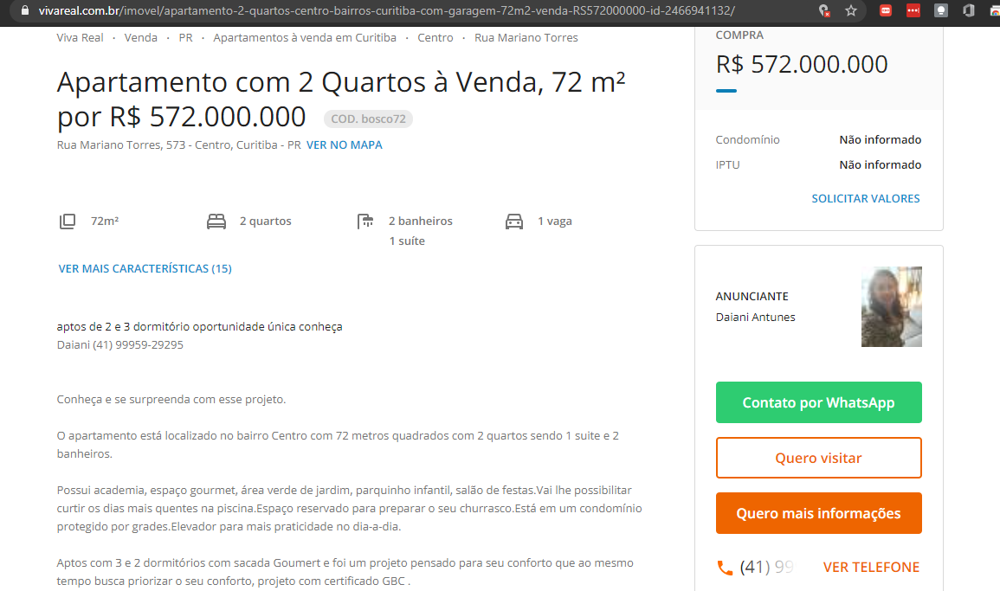

* URL https://www.vivareal.com.br/imovel/apartamento-2-quartos-centro-bairros-curitiba-com-garagem-72m2-venda-RS572000000-id-2466941132/:
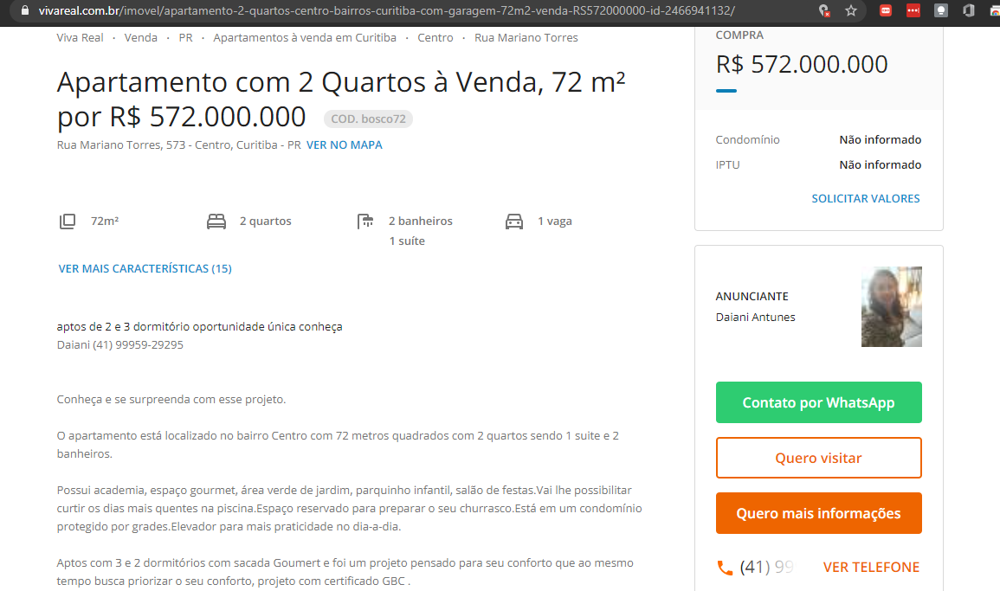

As noted, the scrapping was successful. A key point here: from any further analysis we will have to check forthe price/size outliers.

In [103]:
print('The biggest (in area) apartment  have: ', df_city_filter.min_size.max(), ' squared meters')
df_city_filter[df_city_filter.min_size == df_city_filter.min_size.max()]

The biggest (in area) apartment  have:  982.0  squared meters


,address,size,price,garage,bedroom,bathroom,url,street_name,number,city,neighborhood,price_adj,min_size,max_size,min_garage,max_garage,ratio_price_sq_mtrs
6314,"Rua Bento Viana, 1078 - Água Verde, Curitiba - PR",982,R$ 13.462.100,6,4,5,https://www.vivareal.com.br/imovel/apartamento-4-quartos-agua-verde-bairros-curitiba-com-garagem-982m2-venda-RS13462100-id-2498414877/,Rua Bento Viana,1078,Curitiba,Água Verde,13462100.0,982.0,nan,6,None,13708.859470468431


# Outliers classification
Since we have some sparse values on price/size ratio, I decided to apply a cut off of 40% of the standard deviation of the data.

In [104]:
from numpy import mean
from numpy import std
# calculate summary statistics
data_mean, data_std = mean(df_city_filter.ratio_price_sq_mtrs), std(df_city_filter.ratio_price_sq_mtrs)
# identify outliers
cut_off = data_std * 0.4
lower, upper = data_mean - cut_off, data_mean + cut_off
# identify outliers
outliers = [x for x in df_city_filter.ratio_price_sq_mtrs if x < lower or x > upper]
print('Total classified as outliers: %d' % len(outliers))
# remove outliers
outliers_removed = [x for x in df_city_filter.ratio_price_sq_mtrs if x >= lower and x <= upper]
print('Total of observations considered as not being outliers: %d' % len(outliers_removed))
print('Mean: ',data_mean)
print('Std: ', data_std)
print('Lower bound:', lower)
print('Upper bound:', upper)

Total classified as outliers: 4
Total of observations considered as not being outliers: 10483
Mean:  7860.46472977382
Std:  113236.50779142171
Lower bound: -37434.13838679487
Upper bound: 53155.06784634251


In [105]:
df_no_outliers = df_city_filter.loc[(df_city_filter['ratio_price_sq_mtrs']<min(outliers)) & (df_city_filter['price_adj'] > 0)]
df_outliers = df_city_filter.loc[(df_city_filter['ratio_price_sq_mtrs']>=min(outliers)) | (df_city_filter['price_adj'] <= 0 )]

In [106]:
df_no_outliers.sort_values(by='size', ascending= False).head()

,address,size,price,garage,bedroom,bathroom,url,street_name,number,city,neighborhood,price_adj,min_size,max_size,min_garage,max_garage,ratio_price_sq_mtrs
1749,"Rua Castro Alves, 820 - Batel, Curitiba - PR",99,R$ 390.000,1,3,3,https://www.vivareal.com.br/imovel/apartamento-3-quartos-batel-bairros-curitiba-com-garagem-99m2-venda-RS390000-id-2499896522/,Rua Castro Alves,820,Curitiba,Batel,390000.0,99.0,nan,1,None,3939.3939393939395
8827,"Rua Nossa Senhora de Nazaré, 766 - Boa Vista, Curitiba - PR",99,R$ 569.000,2,2,3,https://www.vivareal.com.br/imovel/apartamento-2-quartos-boa-vista-bairros-curitiba-com-garagem-99m2-venda-RS569000-id-2503963047/,Rua Nossa Senhora de Nazaré,766,Curitiba,Boa Vista,569000.0,99.0,nan,2,None,5747.474747474747
9602,"Avenida Paraná, 1706 - Boa Vista, Curitiba - PR",99,R$ 425.000,1,2,1,https://www.vivareal.com.br/imovel/apartamento-2-quartos-boa-vista-bairros-curitiba-com-garagem-99m2-venda-RS425000-id-2503859388/,Avenida Paraná,1706,Curitiba,Boa Vista,425000.0,99.0,nan,1,None,4292.929292929293
2021,"Rua Castro Alves, 820 - Batel, Curitiba - PR",99,R$ 390.000,1,3,3,https://www.vivareal.com.br/imovel/apartamento-3-quartos-batel-bairros-curitiba-com-garagem-99m2-venda-RS390000-id-2489466491/,Rua Castro Alves,820,Curitiba,Batel,390000.0,99.0,nan,1,None,3939.3939393939395
6680,"Rua Maria Clara, 111 - Alto da Glória, Curitiba - PR",99,R$ 901.400,2,3,3,https://www.vivareal.com.br/imovel/apartamento-3-quartos-alto-da-gloria-bairros-curitiba-com-garagem-99m2-venda-RS901400-id-2507557939/,Rua Maria Clara,111,Curitiba,Alto da Glória,901400.0,99.0,nan,2,None,9105.050505050505


In [107]:
df_outliers

,address,size,price,garage,bedroom,bathroom,url,street_name,number,city,neighborhood,price_adj,min_size,max_size,min_garage,max_garage,ratio_price_sq_mtrs
174,"Vila Izabel, Curitiba - PR",10,R$ 111.111.111,--,1,1,https://www.vivareal.com.br/imovel/apartamento-1-quartos-vila-izabel-bairros-curitiba-10m2-venda-RS111111111-id-2468032917/,Vila Izabel,NaN,Curitiba,Vila Izabel,111111111.0,10.0,nan,,-,11111111.1
530,"Rua Mariano Torres, 573 - Centro, Curitiba - PR",10,R$ 786.300,1,3,3,https://www.vivareal.com.br/imovel/apartamento-3-quartos-centro-bairros-curitiba-com-garagem-10m2-venda-RS786300-id-2482565411/,Rua Mariano Torres,573,Curitiba,Centro,786300.0,10.0,nan,1,None,78630.0
1610,"Rua Amintas de Barros, 39 - Centro, Curitiba - PR",105,R$ 350.000.000,1,3,1,https://www.vivareal.com.br/imovel/apartamento-3-quartos-centro-bairros-curitiba-com-garagem-105m2-venda-RS350000000-id-2476161692/,Rua Amintas de Barros,39,Curitiba,Centro,350000000.0,105.0,nan,1,None,3333333.3333333335
4379,"Rua Professor Pedro Viriato Parigot de Souza, 2795 - Ecoville, Curitiba - PR",525,R$ 0,5,4,5,https://www.vivareal.com.br/imovel/apartamento-4-quartos-ecoville-bairros-curitiba-com-garagem-525m2-venda-id-2481692698/,Rua Professor Pedro Viriato Parigot de Souza,2795,Curitiba,Ecoville,0.0,525.0,nan,5,None,0.0
7773,"Rua Luísa Dariva - Ecoville, Curitiba - PR",438,R$ 75.140.419,5,4,6,https://www.vivareal.com.br/imovel/apartamento-4-quartos-ecoville-bairros-curitiba-com-garagem-438m2-venda-RS75140419-id-2499561115/,Rua Luísa Dariva Ecoville,NaN,Curitiba,Ecoville,75140419.0,438.0,nan,5,None,171553.46803652967


In [108]:
df_no_outliers.neighborhood.unique()

array(['Vila Izabel', 'Centro', 'Juvevê', 'Capão Raso', 'Portão',
       'Ecoville', 'Alto da Glória', 'Batel', 'Cristo Rei', 'Cabral',
       'Água Verde', 'Centro Cívico', 'Cidade Industrial',
       'Campo Comprido', 'Ahú', 'Novo Mundo', 'Champagnat', 'Bacacheri',
       'Xaxim', 'Alto Boqueirão', 'Santa Cândida',
       'Sitio Cercado Bairro Novo B', 'Bigorrilho', 'Mercês', 'Boa Vista',
       'Jardim das Américas', 'Santa Quitéria', 'Guaíra', 'Santo Inácio',
       'Uberaba', 'Tarumã', 'Santa Felicidade', 'Hauer', 'Rebouças',
       'Fazendinha', 'Orleans', 'Tingui', 'Alto da Rua XV', 'Pinheirinho',
       'Jardim Botânico', 'Sitio Cercado', 'Prado Velho', 'Pilarzinho',
       'Mossunguê', 'Fanny', 'Hugo Lange', 'Boqueirão', 'Lindóia',
       'Atuba', 'Cajuru', 'Tatuquara', 'Augusta', 'Campina do Siqueira',
       'Seminário', 'Carmo', 'Neoville', 'Bairro Alto', 'Parolin',
       'Capão da Imbuia', 'Campo de Santana', 'São Lourenço', 'Cachoeira',
       'São Francisco', 'Bom Retir

In [109]:
print('Minimum price/size ratio: ', df_no_outliers.ratio_price_sq_mtrs.min())
print('Mean price/size ratio: ', df_no_outliers.ratio_price_sq_mtrs.mean())
print('Maximum price/size ratio: ', df_no_outliers.ratio_price_sq_mtrs.max())

Minimum price/size ratio:  605.6701030927835
Mean price/size ratio:  6462.322621614948
Maximum price/size ratio:  52881.7


# Price to size ratio histogram
To vizualize how the ratio is distributed accross the data, I plotted a histogram of prices. The histogram shows how most of the listed apartments have their price to size ratio between 3k to 8.4k BRL.

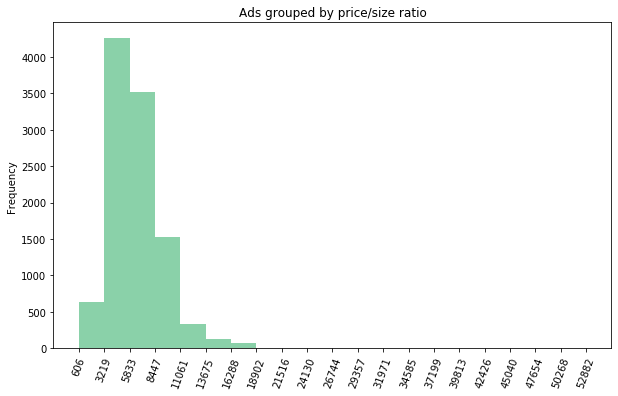

In [110]:
count, bin_edges = np.histogram(df_no_outliers.ratio_price_sq_mtrs, 20)

df_no_outliers.ratio_price_sq_mtrs.plot(kind ='hist', 
          figsize=(10, 6),
          bins=20,
          alpha=0.6,
          xticks=bin_edges,
          rot=70,
          color=['mediumseagreen'],
          title='Ads grouped by price/size ratio'
         )

In [111]:
df_no_outliers[df_city_filter.min_size == df_no_outliers.min_size.max()]

C:\Users\handr\anaconda3\lib\site-packages\ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


,address,size,price,garage,bedroom,bathroom,url,street_name,number,city,neighborhood,price_adj,min_size,max_size,min_garage,max_garage,ratio_price_sq_mtrs
6314,"Rua Bento Viana, 1078 - Água Verde, Curitiba - PR",982,R$ 13.462.100,6,4,5,https://www.vivareal.com.br/imovel/apartamento-4-quartos-agua-verde-bairros-curitiba-com-garagem-982m2-venda-RS13462100-id-2498414877/,Rua Bento Viana,1078,Curitiba,Água Verde,13462100.0,982.0,nan,6,None,13708.859470468431


# Min size
As being the most relevant feature in terms of sizing (since not all the apartments have a range of min and max), I decided to check what is the most common size by checking the column called *min_size*.
With the histogram we can check that most of the apartments are under 200 squared meters in size.

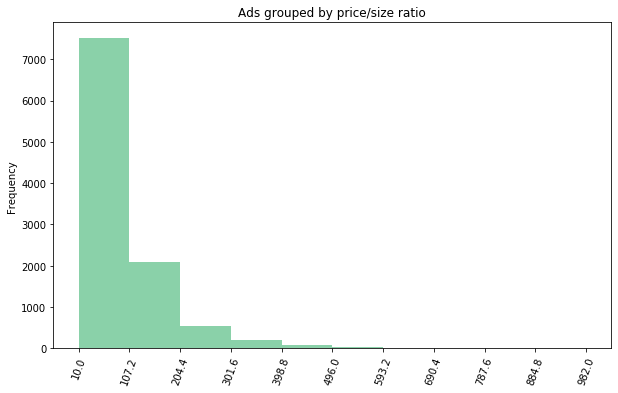

In [113]:
count, bin_edges = np.histogram(df_no_outliers.min_size, 10)

df_no_outliers.min_size.plot(kind ='hist', 
          figsize=(10, 6),
          bins=10,
          alpha=0.6,
          xticks=bin_edges,
          rot=70,
          color=['mediumseagreen'],
          title='Ads grouped by price/size ratio'
         )

# Further analysis on price/size
When applying the variable of the ratio in a box plot, we can see that most of the data is below the 10k BRL. The most expensive one is over 50k BRL for a single squared meter.

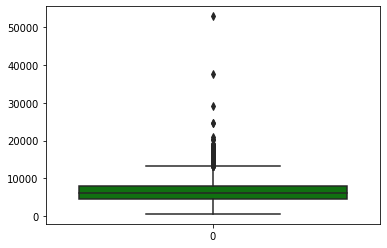

In [114]:
sns.boxplot(data = df_no_outliers.ratio_price_sq_mtrs,color='g')

# Mean prices - check for the top 10 most expensive neighborhoods
From now, I just want to check for the releavant information about the neighborhoods.

In [116]:
result = df_no_outliers.groupby('neighborhood').agg({'ratio_price_sq_mtrs': ['count','mean', 'min', 'max']})
result.reset_index()
print('Showing the top 10 neighborhoods with the most expensive mean price/size ratio')
result.sort_values(by = ('ratio_price_sq_mtrs','mean'), ascending=False).round(2).head(10)

Showing the top 10 neighborhoods with the most expensive mean price/size ratio


ratio_price_sq_mtrs                           
                                  count     mean      min      max
neighborhood                                                      
Barigui                              10 12121.83   5000.0 17550.27
Alto Gloria                           1 12092.44 12092.44 12092.44
Campina do Siqueira                  53  9315.72  2797.75  52881.7
Ecoville                            402  8261.07  2815.22 21066.91
Ahú                                 185  8116.61  3295.02 17699.69
Cabral                              539  8113.21  2616.28 18766.92
Mossunguê                           155  8042.71   3300.0  20404.7
Batel                               530  7963.76  2102.41 19011.41
Hugo Lange                           47  7774.57  3181.82  12055.5
Alto da Glória                      223  7771.53  2785.71  14580.0

In [118]:
print('Showing the top 10 neighborhoods that have more units being listed')
result.sort_values(by = ('ratio_price_sq_mtrs','count'), ascending=False).round(2).head(10)

Showing the top 10 neighborhoods that have more units being listed


ratio_price_sq_mtrs                         
                           count    mean     min      max
neighborhood                                             
Água Verde                  1036 6805.53 1971.78 24556.96
Portão                       791 5972.31 2295.08 10258.06
Centro                       698 6258.43  1750.0 17679.74
Vila Izabel                  642 7763.16 2539.68 13179.67
Cabral                       539 8113.21 2616.28 18766.92
Batel                        530 7963.76 2102.41 19011.41
Bigorrilho                   466 7201.06  3250.0 37726.04
Ecoville                     402 8261.07 2815.22 21066.91
Cristo Rei                   366 6130.94  2399.0 13691.51
Juvevê                       329 7715.83  2350.8 17566.48

In [119]:
print('Showing the top 10 cheapest neighborhoods based on their price/squared meters ratio')
result.sort_values(by = ('ratio_price_sq_mtrs','min'), ascending=True).round(2).head(10)

Showing the top 10 cheapest neighborhoods based on their price/squared meters ratio


ratio_price_sq_mtrs                         
                                count    mean     min      max
neighborhood                                                  
Boa Vista                         294  5804.2  605.67 10803.92
Augusta                             9 2846.17  1255.7  3265.31
Cachoeira                          15 2847.61  1350.0  3555.56
Parolin                            17 3978.24 1452.28  6637.17
Centro                            698 6258.43  1750.0 17679.74
Novo Mundo                        275  4838.4 1785.71 18945.65
Sitio Cercado                      77 3381.57  1875.0   5108.7
Mercês                            235 7640.19 1883.33 16612.64
Neoville                           17 4160.17 1911.76  5406.78
Cidade Industrial                 236 4710.81 1922.67 10077.52


# Build geolocation data
In order to get a visualization of how the city looks like, I need to add some features of geolocation. To get the latitude and longitude I used the geopy/fiona and plotted the map using Folium library.

In [120]:
locator = Nominatim(user_agent="myGeocoder")
location = locator.geocode("Curitiba, Paraná, Brazil")

In [122]:
print('Checking if the starting location is correct:')
location

Checking if the starting location is correct:


Location(Curitiba, Região Geográfica Imediata de Curitiba, Região Metropolitana de Curitiba, Região Geográfica Intermediária de Curitiba, Paraná, Região Sul, Brasil, (-25.4295963, -49.2712724, 0.0))

In [123]:
df_no_outliers.head()

,address,size,price,garage,bedroom,bathroom,url,street_name,number,city,neighborhood,price_adj,min_size,max_size,min_garage,max_garage,ratio_price_sq_mtrs
0,"Rua Coronel Ottoni Maciel, 228 - Vila Izabel, Curitiba - PR",106,R$ 725.000,1,3,3,https://www.vivareal.com.br/imovel/apartamento-3-quartos-vila-izabel-bairros-curitiba-com-garagem-106m2-venda-RS725000-id-2501621509/,Rua Coronel Ottoni Maciel,228,Curitiba,Vila Izabel,725000.0,106.0,nan,1,None,6839.622641509434
1,"Avenida Marechal Floriano Peixoto, 696 - Centro, Curitiba - PR",33,R$ 240.000,--,1,1,https://www.vivareal.com.br/imoveis-lancamento/central-station-2473213876/,Avenida Marechal Floriano Peixoto,696,Curitiba,Centro,240000.0,33.0,nan,,-,7272.727272727273
2,"Avenida João Gualberto, 1313 - Juvevê, Curitiba - PR",77,R$ 380.000,1,2,1,https://www.vivareal.com.br/imovel/apartamento-2-quartos-juveve-bairros-curitiba-com-garagem-77m2-venda-RS380000-id-2468009070/,Avenida João Gualberto,1313,Curitiba,Juvevê,380000.0,77.0,nan,1,None,4935.064935064935
3,"Rua Francisco Raitani, 7081 - Capão Raso, Curitiba - PR",70,R$ 260.000,1,3,2,https://www.vivareal.com.br/imovel/apartamento-3-quartos-capao-raso-bairros-curitiba-com-garagem-70m2-venda-RS260000-id-2506743276/,Rua Francisco Raitani,7081,Curitiba,Capão Raso,260000.0,70.0,nan,1,None,3714.285714285714
4,"Rua Morretes, 1174 - Portão, Curitiba - PR",73,R$ 500.000,2,3,2,https://www.vivareal.com.br/imovel/apartamento-3-quartos-portao-bairros-curitiba-com-garagem-73m2-venda-RS500000-id-2472408476/,Rua Morretes,1174,Curitiba,Portão,500000.0,73.0,nan,2,None,6849.315068493151


In [ ]:
# 1 - conveneint function to delay between geocoding calls
geocode = RateLimiter(locator.geocode, min_delay_seconds=1)
# 2- - create location column
df_no_outliers['location'] = df_no_outliers['address'].apply(geocode)
# 3 - create longitude, laatitude and altitude from location column (returns tuple)
df_no_outliers['point'] = df_no_outliers['location'].apply(lambda loc: tuple(loc.point) if loc else None)
# 4 - split point column into latitude, longitude and altitude columns
df_no_outliers[['latitude', 'longitude', 'altitude']] = pd.DataFrame(df_no_outliers['point'].tolist(), index=df_no_outliers.index)

Since we have some issues related to quality of the addresses, some of them were not found to get a latitude and longitude. Further analysis must be done in order to treat those instead of dropping them.

In [ ]:
df_no_outliers=df_no_outliers.dropna(subset=['longitude'])
df_no_outliers=df_no_outliers.dropna(subset=['latitude'])

In [ ]:
df_no_outliers.shape

In [63]:
# create map and display it
cwb_map = folium.Map(location=[-25.4295963, -49.2712724], zoom_start=12,  tiles='cartodbpositron')

In [62]:
from folium import plugins

# let's start again with a clean copy of the map of San Francisco
cwb_map = folium.Map(location=[-25.4295963, -49.2712724], zoom_start=12,  tiles='cartodbpositron')

# instantiate a mark cluster object for the incidents in the dataframe
listings = plugins.MarkerCluster().add_to(cwb_map)

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, label, in zip(df_no_outliers.latitude, df_no_outliers.longitude, df_no_outliers.neighborhood):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=label,
    ).add_to(listings)

# display map
cwb_map

Next steps: build a predictor based on apartments details.